In [1]:
## Packages
# system
import os
# data wrangling
import numpy as np
import pandas as pd
from scipy import stats
from dfply import *
import statistics
# plotting
import matplotlib.pyplot as plt
import seaborn as sns

## Settings
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None) 
pd.set_option('display.width', 1000)

In [2]:
print('pandas version', pd.__version__)
print('numpy version', np.__version__)

pandas version 1.0.4
numpy version 1.18.5


### Data Import

In [3]:
## read in data 
raw_path = os.path.join('../../../', 'raw_data/')
processed_path = os.path.join('../', 'processed_data/')

# bene = pd.read_csv(os.path.join(raw_path, 'Train_Beneficiarydata-1542865627584.csv'))
# flag = pd.read_csv(os.path.join(raw_path, 'Train-1542865627584.csv'))

df_ip = pd.read_csv(os.path.join(processed_path,'df_ip.csv'), index_col = 0)
df_op = pd.read_csv(os.path.join(processed_path,'df_op.csv'), index_col = 0)

In [4]:
raw_path = os.path.join('../../../', 'raw_data/')
raw_path

'../../../raw_data/'

In [5]:
df_ip.head(2)

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,DOB,DOD,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,PotentialFraud,ClaimDuration,HospitalDuration,TotalPaid
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,4019,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1943-01-01,NaN,1,1,0,39,230,12,12,0,1,0,1,1,0,0,0,1,0,0,36000,3204,60,70,Yes,6,6,27068.0
1,BENE17521,CLM34721,2009-01-20,2009-02-01,PRV55912,19000,PHY349293,PHY370861,PHY363291,2009-01-20,45340,1068.0,2009-02-01,987,4240,2639,2948,40390,45821,28489,5854,2753,E9305,NaN,7769.0,5849.0,NaN,NaN,NaN,NaN,1913-12-01,NaN,2,1,0,39,230,12,12,0,0,0,1,0,1,1,0,1,1,1,19000,1068,100,20,Yes,12,12,20068.0


### imputatation

In [6]:
# # impute empty codes with 0
# print(inpt[inpt.columns[inpt.columns.str.contains(pat = 'Code')]].eq(0).any()) # check no code is currently 0

# # fill NA codes with 0
# # inpt.filter(like = 'Code', axis = 1)
# code_col_inpt = inpt.columns[inpt.columns.str.contains(pat = 'Code')]
# inpt[code_col_inpt] = inpt[code_col_inpt].fillna(0)
# code_col_outpt = outpt.columns[outpt.columns.str.contains(pat = 'Code')]
# outpt[code_col_outpt] = outpt[code_col_outpt].fillna(0)
# outpt.head(4)

In [7]:
# check no code is currently 0
print(df_ip[df_ip.columns[df_ip.columns.str.contains(pat = 'Cdoe')]].eq(0).any())

# # fill NA codes with 0
code_col_ip = df_ip.columns[df_ip.columns.str.contains(pat = 'Code')]
df_ip[code_col_ip] = df_ip[code_col_ip].fillna(0)

code_col_op = df_op.columns[df_op.columns.str.contains(pat = 'Code')]
df_op[code_col_op] = df_op[code_col_op].fillna(0)

Series([], dtype: bool)


### duplicated claim numbers

In [8]:
# code columns
code_ip = df_ip.columns[df_ip.columns.str.contains('Code')]
diagnosiscode_ip = df_ip.columns[df_ip.columns.str.contains('DiagnosisCode_')]
procedurecode_ip = df_ip.columns[df_ip.columns.str.contains('ProcedureCode_')]
print('IP diagnosis code', len(diagnosiscode_ip))
print('IP procedure code', len(procedurecode_ip))

code_op = df_op.columns[df_op.columns.str.contains('Code')]
diagnosiscode_op = df_op.columns[df_op.columns.str.contains('DiagnosisCode_')]
procedurecode_op = df_op.columns[df_op.columns.str.contains('ProcedureCode_')]
print('OP diagnosis code', len(diagnosiscode_op))
print('OP procedure code', len(procedurecode_op))

print(diagnosiscode_op == diagnosiscode_ip)
print(procedurecode_op == procedurecode_ip)

code = df_ip.columns[df_ip.columns.str.contains('Code')]
diagnosiscode = df_ip.columns[df_ip.columns.str.contains('DiagnosisCode_')]
procedurecode = df_ip.columns[df_ip.columns.str.contains('ProcedureCode_')]
print('diagnosis code', len(diagnosiscode))
print('procedure code', len(procedurecode))


IP diagnosis code 10
IP procedure code 6
OP diagnosis code 10
OP procedure code 6
[ True  True  True  True  True  True  True  True  True  True]
[ True  True  True  True  True  True]
diagnosis code 10
procedure code 6


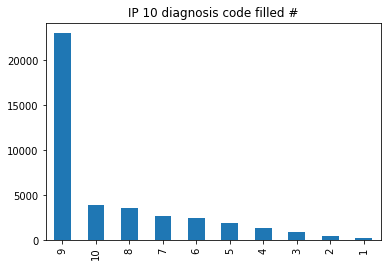

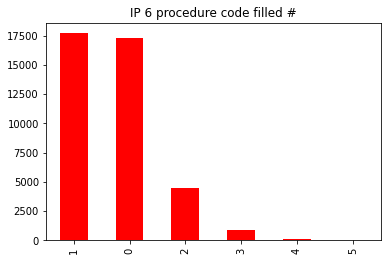

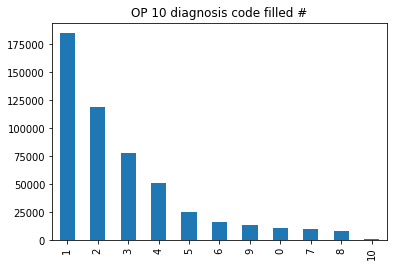

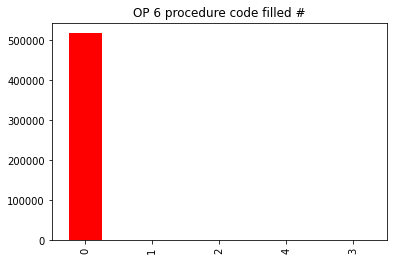

In [10]:
# IP diagnosis code number
df_ip[diagnosiscode].ne(0).sum(axis=1).value_counts().plot(kind = 'bar',title = 'IP 10 diagnosis code filled #')
plt.savefig('../output/ip_diagnosis_code_filled.png')
plt.show()
# IP procedure code number
df_ip[procedurecode].ne(0).sum(axis=1).value_counts().plot(kind = 'bar',title = 'IP 6 procedure code filled #', color = 'red')
plt.savefig('../output/ip_procedure_code_filled.png')
plt.show()

# OP diagnosis code number
df_op[diagnosiscode].ne(0).sum(axis=1).value_counts().plot(kind = 'bar',title = 'OP 10 diagnosis code filled #')
plt.savefig('../output/op_diagnosis_code_filled.png')
plt.show()
# OP procedure code number
df_op[procedurecode].ne(0).sum(axis=1).value_counts().plot(kind = 'bar',title = 'OP 6 procedure code filled #', color = 'red')
plt.savefig('../output/op_procedure_code_filled.png')
plt.show()



In [12]:
# duplicated claims
code_for_duplicate = ['ClmDiagnosisCode_1','ClmDiagnosisCode_2', 
                      'ClmProcedureCode_1', 
                      'ClmAdmitDiagnosisCode']

# keep = first will mark all duplicates except the 1st occurrence
df_ip_duplicate = df_ip.duplicated(subset = code_for_duplicate, keep='first').sum()
print('inpatient claims', df_ip.shape[0], 'duplicate #', df_ip_duplicate, round(df_ip_duplicate/df_ip.shape[0], ndigits = 3))

df_op_duplicate = df_op.duplicated(subset = code_for_duplicate, keep='first').sum()
print('outpatient claims', df_op.shape[0], 'duplicate #', df_op_duplicate, round(df_op_duplicate/df_op.shape[0], ndigits = 3))

inpatient claims 40474 duplicate # 3759 0.093
outpatient claims 517737 duplicate # 280714 0.542


In [13]:
# duplicated claims
code_for_duplicate = ['ClmDiagnosisCode_1','ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
                      'ClmProcedureCode_1',  
                      'ClmAdmitDiagnosisCode']


# keep = first will mark all duplicates except the 1st occurrence
df_ip_duplicate = df_ip.duplicated(subset = code_for_duplicate, keep=False).sum()
print('inpatient claims', df_ip.shape[0], 'duplicate #', df_ip_duplicate, round(df_ip_duplicate/df_ip.shape[0], ndigits = 3))

df_op_duplicate = df_op.duplicated(subset = code_for_duplicate, keep=False).sum()
print('outpatient claims', df_op.shape[0], 'duplicate #', df_op_duplicate, round(df_op_duplicate/df_op.shape[0], ndigits = 3))

inpatient claims 40474 duplicate # 1658 0.041
outpatient claims 517737 duplicate # 241447 0.466


In [14]:
# duplicated claims
code_for_duplicate = ['ClmDiagnosisCode_1','ClmDiagnosisCode_2', 'ClmDiagnosisCode_3','ClmDiagnosisCode_4',
                      'ClmProcedureCode_1', 'ClmProcedureCode_2', 
                      'ClmAdmitDiagnosisCode']


# keep = first will mark all duplicates except the 1st occurrence
df_ip_duplicate = df_ip.duplicated(subset = code_for_duplicate, keep=False).sum()
print('inpatient claims', df_ip.shape[0], 'duplicate #', df_ip_duplicate, round(df_ip_duplicate/df_ip.shape[0], ndigits = 3))

df_op_duplicate = df_op.duplicated(subset = code_for_duplicate, keep=False).sum()
print('outpatient claims', df_op.shape[0], 'duplicate #', df_op_duplicate, round(df_op_duplicate/df_op.shape[0], ndigits = 3))

inpatient claims 40474 duplicate # 1433 0.035
outpatient claims 517737 duplicate # 230185 0.445


In [15]:
# duplicated claims
code_for_duplicate = ['ClmDiagnosisCode_1','ClmDiagnosisCode_2', 'ClmDiagnosisCode_3','ClmDiagnosisCode_4','ClmDiagnosisCode_5',
                      'ClmProcedureCode_1',
                      'ClmAdmitDiagnosisCode']


# keep = first will mark all duplicates except the 1st occurrence
df_ip_duplicate = df_ip.duplicated(subset = code_for_duplicate, keep=False).sum()
print('inpatient claims', df_ip.shape[0], 'duplicate #', df_ip_duplicate, round(df_ip_duplicate/df_ip.shape[0], ndigits = 3))

df_op_duplicate = df_op.duplicated(subset = code_for_duplicate, keep=False).sum()
print('outpatient claims', df_op.shape[0], 'duplicate #', df_op_duplicate, round(df_op_duplicate/df_op.shape[0], ndigits = 3))

# keep = False, 'fist', 'last'
# use column index instead of column name?

inpatient claims 40474 duplicate # 1433 0.035
outpatient claims 517737 duplicate # 229202 0.443


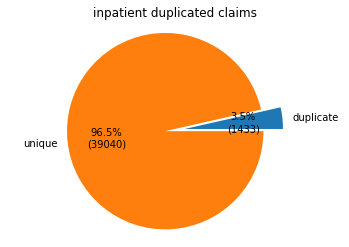

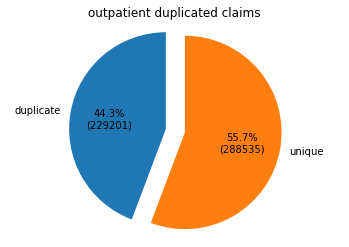

In [16]:
# plot set up
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)
labels = ['duplicate', 'unique']
explode = [0, 0.2]

# plots
pie_df_ip = [df_ip_duplicate, df_ip.shape[0]-df_ip_duplicate]
fig1, ax1 = plt.subplots()
ax1.pie(pie_df_ip, explode = explode, labels = labels, 
        autopct = lambda pct: func(pct, pie_df_ip), textprops = dict(color = 'black'))
ax1.axis('equal')
plt.title('inpatient duplicated claims')
# plt.show()
plt.savefig('../output/duplicate_inpatient.png')

pie_outpt = [df_op_duplicate, df_op.shape[0]-df_op_duplicate]
fig2, ax2 = plt.subplots()
ax2.pie(pie_outpt, explode = explode, labels = labels, startangle=90,
       autopct = lambda pct: func(pct, pie_outpt), textprops = dict(color = 'black'))
ax2.axis('equal')
plt.title('outpatient duplicated claims')
# plt.show()
plt.savefig('../output/duplicate_outpatient.png')
# autopct='%1.1f%%' for just percentage

## Q: if a code is NA is included as duplicates

#### make new duplicated claims into dataframe: label each group

In [17]:
# duplicate claim dataframe
dup_ip = df_ip[df_ip.duplicated(subset = code_for_duplicate, keep=False)].sort_values(by = 'ClmDiagnosisCode_1')
print(dup_ip.shape)
print(dup_ip.duplicated(subset = code_for_duplicate, keep = False).all())

# number duplicated groups
# ngroup_dup_ip = dup_ip.groupby(code_for_duplicate).ngroups
# dup_ip_state = dup_ip.groupby(code_for_duplicate)
dup_ip['group'] = dup_ip.groupby(code_for_duplicate).grouper.group_info[0] + 1
display(dup_ip.group.head())

(1433, 58)
True


22904    1
10448    1
23923    2
13514    2
11871    3
Name: group, dtype: int64

In [18]:
m = dup_ip.groupby('group').Provider.nunique().to_frame().Provider.value_counts()
dup_ip.groupby('group').Provider.nunique() == 1

group
1      False
2      False
3      False
4      False
5      False
6      False
7      False
8      False
9      False
10     False
11     False
12     False
13     False
14     False
15     False
16     False
17     False
18     False
19     False
20     False
21     False
22     False
23     False
24     False
25     False
26     False
27     False
28     False
29     False
30     False
31     False
32     False
33     False
34     False
35     False
36     False
37     False
38     False
39     False
40     False
41     False
42     False
43     False
44     False
45      True
46     False
47     False
48     False
49     False
50     False
51     False
52     False
53     False
54     False
55     False
56     False
57     False
58     False
59     False
60     False
61     False
62     False
63     False
64     False
65      True
66     False
67     False
68     False
69     False
70     False
71     False
72     False
73     False
74     False
75     False
76     False
77    

In [19]:
# code_dup_flag
code_dup_flag = code_for_duplicate + ['PotentialFraud']
code_dup_flag

['ClmDiagnosisCode_1',
 'ClmDiagnosisCode_2',
 'ClmDiagnosisCode_3',
 'ClmDiagnosisCode_4',
 'ClmDiagnosisCode_5',
 'ClmProcedureCode_1',
 'ClmAdmitDiagnosisCode',
 'PotentialFraud']

#### Number of providers per duplicated group

,,,,,,,Provider
ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmProcedureCode_1,ClmAdmitDiagnosisCode,
71536,0,0,0,0,8154.0,71536,5
486,0,0,0,0,0.0,486,4
99643,5854,29650,E8859,40391,80.0,99642,4
4111,25000,V0382,5849,4019,0.0,78659,4
6826,5559,25000,71590,41400,9921.0,6850,4


,Provider
2,685
3,14
4,4
5,1


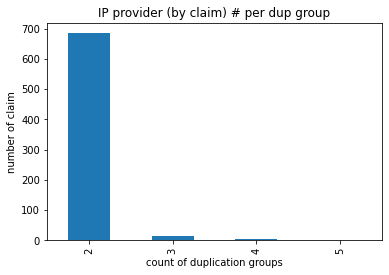

In [30]:
ip_dup_provider_byclaim = pd.DataFrame(dup_ip.groupby(code_for_duplicate).Provider.count()).sort_values(by = 'Provider', ascending = False)
ip_dup_provider_byclaim.Provider.value_counts().plot(kind = 'bar', title = 'IP provider (by claim) # per dup group')
plt.ylabel("number of claim")
plt.xlabel('count of duplication groups')
plt.savefig('../output/ip_unique_claim_per_dup_group.png')

display(ip_dup_provider_byclaim.head())
display(ip_dup_provider_byclaim.Provider.value_counts().to_frame())

,,,,,,,Provider
ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmProcedureCode_1,ClmAdmitDiagnosisCode,
71536,0,0,0,0,8154.0,71536,5
4111,25000,V0382,5849,4019,0.0,78659,4
6826,5559,25000,71590,41400,9921.0,6850,4
99643,5854,29650,E8859,40391,80.0,99642,4
486,0,0,0,0,0.0,486,4


,Provider
2,672
1,15
3,12
4,4
5,1


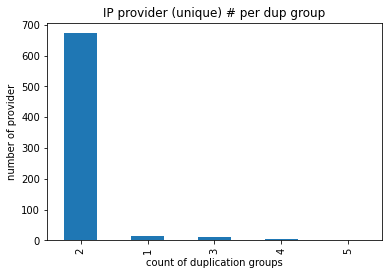

In [29]:
ip_dup_provider_unique = pd.DataFrame(dup_ip.groupby(code_for_duplicate).Provider.nunique()).sort_values(by = 'Provider', ascending = False)
ip_dup_provider_unique.Provider.value_counts().plot(kind = 'bar',title = 'IP provider (unique) # per dup group')
plt.ylabel("number of provider")
plt.xlabel('count of duplication groups')
plt.savefig('../output/ip_unique_provider_per_dup_group.png')


display(ip_dup_provider_unique.head())
display(ip_dup_provider_unique.Provider.value_counts().to_frame())

### duplicated groups provider flagged or not

In [32]:
dup_ip_provider = dup_ip[['group', 'PotentialFraud','Provider']]
dup_ip_provider = dup_ip_provider.sort_values(by = 'group')
# dup_ip_provider = dup_ip.groupby('group')['group', 'PotentialFraud','Provider']

In [33]:
# dup_ip_provider.groupby('group').Provider.nunique()
dup_ip_provider.reset_index().drop(['index'], axis = 1, inplace=True)
dup_ip_provider.head()

,group,PotentialFraud,Provider
22904,1,Yes,PRV51940
10448,1,Yes,PRV55209
23923,2,No,PRV55916
13514,2,Yes,PRV56560
11871,3,Yes,PRV53855


In [34]:
dup_ip_provider.group.nunique()

704

In [35]:
# provider number per group-flag
dup_ip_provider_1 = pd.DataFrame(dup_ip_provider.groupby(['group', 'PotentialFraud']).Provider.nunique())
dup_ip_provider_1.head()

Provider
group PotentialFraud          
1     Yes                    2
2     No                     1
      Yes                    1
3     Yes                    2
4     No                     1

In [36]:
# pivot by fraud flag
dup_ip_provider_2 = dup_ip_provider_1.pivot_table(index = 'group', columns = 'PotentialFraud', values = 'Provider')
print(dup_ip_provider_2.columns)
display(dup_ip_provider_2)

Index(['No', 'Yes'], dtype='object', name='PotentialFraud')


PotentialFraud,No,Yes
group,,
1,NaN,2.0
2,1.0,1.0
3,NaN,2.0
4,1.0,1.0
5,1.0,1.0
6,NaN,2.0
7,1.0,1.0
8,1.0,1.0
9,NaN,2.0


In [37]:
# value counts flag vs no flag
dup_ip_provider_2.head()

PotentialFraud,No,Yes
group,,
1,NaN,2.0
2,1.0,1.0
3,NaN,2.0
4,1.0,1.0
5,1.0,1.0


In [38]:
# dup_ip_provider_2['noflag'] = 
dup_ip_provider_2['hasNo'] = dup_ip_provider_2['No'].isnull()
print('# of groups has no flagged provider', dup_ip_provider_2.hasNo.sum())
print('total # of groups', len(dup_ip_provider_2))
print('percentage', round(dup_ip_provider_2.hasNo.sum() / len(dup_ip_provider_2), ndigits=4)*100, '%')

# of groups has no flagged provider 233
total # of groups 704
percentage 33.1 %


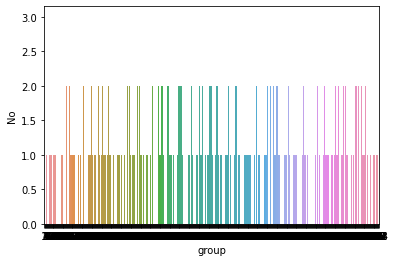

In [39]:
sns.barplot(x = dup_ip_provider_2.index, y = 'No', data = dup_ip_provider_2)

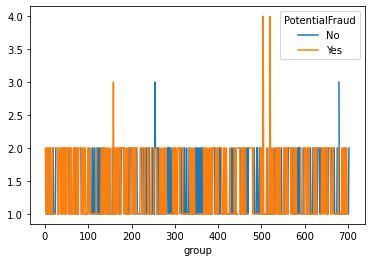

In [40]:
dup_ip_provider_2.plot()

In [41]:
# provider
# pd.DataFrame(dup_ip.groupby(code_for_duplicate).Provider.nunique().sort_values(ascending = False))
# claims
# pd.DataFrame(dup_ip.groupby(code_for_duplicate).ClaimID.nunique().sort_values(ascending = False))

##### new features

In [42]:
# number of duplicated claims per provider (or ratio)
# does this provider has a duplicated claim

#### provider info giver & info receivers

In [43]:
dup_ip_provider_claimDt = dup_ip[['group', 'PotentialFraud','Provider','ClaimStartDt']].sort_values(by = 'group')
dup_ip_provider_claimDt = dup_ip_provider_claimDt.reset_index().drop(['index'], axis = 1)
dup_ip_provider_claimDt.head(10)

,group,PotentialFraud,Provider,ClaimStartDt
0,1,Yes,PRV51940,2009-04-19
1,1,Yes,PRV55209,2009-12-14
2,2,No,PRV55916,2009-01-08
3,2,Yes,PRV56560,2009-06-16
4,3,Yes,PRV53855,2009-09-07
5,3,Yes,PRV52019,2009-12-09
6,4,Yes,PRV51146,2009-01-06
7,4,No,PRV53308,2009-05-18
8,5,No,PRV51108,2009-11-20
9,5,Yes,PRV53242,2009-06-06


In [44]:
dup_ip_provider_claimDt.groupby(['group', 'PotentialFraud'])['ClaimStartDt'].unique().to_frame().head()

ClaimStartDt
group PotentialFraud                          
1     Yes             [2009-04-19, 2009-12-14]
2     No                          [2009-01-08]
      Yes                         [2009-06-16]
3     Yes             [2009-09-07, 2009-12-09]
4     No                          [2009-05-18]

In [45]:
dup_ip_provider_claimDt.groupby(['group', 'PotentialFraud'])['Provider'].unique().to_frame().head()

Provider
group PotentialFraud                      
1     Yes             [PRV51940, PRV55209]
2     No                        [PRV55916]
      Yes                       [PRV56560]
3     Yes             [PRV53855, PRV52019]
4     No                        [PRV53308]

In [46]:
dup_ip_provider_claimDt_group = dup_ip_provider_claimDt.groupby(['group', 'PotentialFraud', 'Provider'])\
['ClaimStartDt'].unique().to_frame()
dup_ip_provider_claimDt_group.head(15)

ClaimStartDt
group PotentialFraud Provider              
1     Yes            PRV51940  [2009-04-19]
                     PRV55209  [2009-12-14]
2     No             PRV55916  [2009-01-08]
      Yes            PRV56560  [2009-06-16]
3     Yes            PRV52019  [2009-12-09]
                     PRV53855  [2009-09-07]
4     No             PRV53308  [2009-05-18]
      Yes            PRV51146  [2009-01-06]
5     No             PRV51108  [2009-11-20]
      Yes            PRV53242  [2009-06-06]
6     Yes            PRV52019  [2009-06-06]
                     PRV56732  [2009-04-04]
7     No             PRV51342  [2009-11-10]
      Yes            PRV55171  [2009-10-21]
8     No             PRV52027  [2009-08-08]

In [47]:
dup_ip_provider_claimDt.groupby('group').Provider.nunique()
dup_ip_provider_claimDt.iloc[45,]

group                     23
PotentialFraud           Yes
Provider            PRV55897
ClaimStartDt      2009-10-17
Name: 45, dtype: object

In [48]:
# foo = pd.DataFrame(dup_ip_provider_claimDt.groupby(['group', 'PotentialFraud']))
foo = pd.DataFrame(dup_ip_provider_claimDt.groupby(['group']))
# display(foo.iloc[2,])
print('group', foo.iloc[2,0])
display('content', foo.iloc[2,1])
print('row number', len(foo.iloc[2,1]))
display(foo.iloc[2,1].iloc[0,])
print('iloc[i,1]', foo.iloc[0,1].iloc[0,1])
print('iloc[i,2]', foo.iloc[0,1].iloc[0,2])
print('iloc[i,3]', foo.iloc[0,1].iloc[0,3])

group 3


'content'

,group,PotentialFraud,Provider,ClaimStartDt
4,3,Yes,PRV53855,2009-09-07
5,3,Yes,PRV52019,2009-12-09


row number 2


group                      3
PotentialFraud           Yes
Provider            PRV53855
ClaimStartDt      2009-09-07
Name: 4, dtype: object

iloc[i,1] Yes
iloc[i,2] PRV51940
iloc[i,3] 2009-04-19


In [49]:
pd.__version__

'1.0.4'

In [50]:
temp = foo.iloc[2,1]
display(temp)
# temp.ClaimStartDt.idxmax()
temp[temp.ClaimStartDt == temp.ClaimStartDt.max()].Provider.item()

,group,PotentialFraud,Provider,ClaimStartDt
4,3,Yes,PRV53855,2009-09-07
5,3,Yes,PRV52019,2009-12-09


'PRV52019'

In [61]:
temp = foo.iloc[89,1]
display(temp)

,group,PotentialFraud,Provider,ClaimStartDt
182,90,No,PRV51523,2009-10-01
183,90,Yes,PRV52843,2009-11-25


In [65]:
df_ip['Provider'] == 'PRV55912'

0         True
1         True
2         True
3         True
4         True
5         True
6         True
7         True
8         True
9         True
10        True
11        True
12        True
13        True
14        True
15        True
16        True
17        True
18        True
19        True
20        True
21        True
22        True
23        True
24        True
25        True
26        True
27        True
28        True
29        True
30        True
31        True
32        True
33        True
34        True
35        True
36        True
37        True
38        True
39        True
40        True
41        True
42        True
43        True
44        True
45        True
46        True
47        True
48        True
49        True
50        True
51        True
52        True
53        True
54        True
55        True
56        True
57        True
58        True
59        True
60       False
61       False
62       False
63       False
64       False
65       False
66       F

In [72]:
giver = {}
for i in range(len(foo)):
    # foo.iloc[i, 1] is the dataframe of contents
    temp = foo.iloc[i,1] 
    early = temp.ClaimStartDt.min()
    value = temp[temp.ClaimStartDt == early].Provider
    key = i+1
    giver.update({key:value})

In [83]:
# dup_ip_provider_claimDt.Provider.iloc[1] in giver.values()
# 'PRV51940' in giver.values()
giver.values()
# percentage coming from flagged provider
print(giver[45])
print("=============")
print(giver[45].iloc[0])

88    PRV52178
89    PRV52178
Name: Provider, dtype: object
PRV52178


In [86]:
list(map(lambda x: x.iloc[0], giver))

AttributeError: 'int' object has no attribute 'iloc'

In [373]:
dup_ip_provider_claimDt['giver'] = np.where(dup_ip_provider_claimDt.Provider in)
    

,group,PotentialFraud,Provider,ClaimStartDt
0,1,Yes,PRV51940,2009-04-19
1,1,Yes,PRV55209,2009-12-14
2,2,No,PRV55916,2009-01-08
3,2,Yes,PRV56560,2009-06-16
4,3,Yes,PRV53855,2009-09-07


In [230]:
pd.DataFrame(dup_ip_provider_claimDt.groupby(['Provider', 'PotentialFraud']))

,0,1
0,"(PRV51003, Yes)",group PotentialFraud Provider ClaimStar...
1,"(PRV51021, Yes)",group PotentialFraud Provider ClaimStar...
2,"(PRV51023, No)",group PotentialFraud Provider ClaimStart...
3,"(PRV51024, No)",group PotentialFraud Provider ClaimStar...
4,"(PRV51030, No)",group PotentialFraud Provider ClaimStart...
5,"(PRV51037, Yes)",group PotentialFraud Provider ClaimStar...
6,"(PRV51038, No)",group PotentialFraud Provider ClaimStar...
7,"(PRV51040, No)",group PotentialFraud Provider ClaimStar...
8,"(PRV51060, No)",group PotentialFraud Provider ClaimStart...
9,"(PRV51064, Yes)",group PotentialFraud Provider ClaimStart...


#### provider

In [158]:
dup_ip_provider3 = pd.DataFrame(dup_ip.groupby(code_dup_flag).Provider.nunique().sort_values(ascending = False))
dup_ip_provider3 

Provider
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmDiagnosisCode_3 ClmDiagnosisCode_4 ClmDiagnosisCode_5 ClmProcedureCode_1 ClmAdmitDiagnosisCode PotentialFraud          
71536              0                  0                  0                  0                  8154.0             71536                 Yes                    4
6826               5559               25000              71590              41400              9921.0             6850                  Yes                    4
4111               25000              V0382              5849               4019               0.0                78659                 Yes                    3
99859              51189              4019               6822               E8499              3893.0             7295                  No                     3
42843              2724               4019               41401              3970               3722.0             78650                 No                     3
71531              53081              4019               412                41401              8180.0             71531                 Yes                    2
49122              486                3572               E9331              42833              9396.0             49121                 Yes                    2
486                33829              V5861              5771               4019               3893.0             78609                 Yes                    2
                   4019               24290              2809               496                0.0                486                   No                     2
                                      496                V5861              V5419              0.0                78907                 No                     2
                   42731              78057              4292               49390              9394.0             4589                  No                     2
                   6930               3320               40391              E9320              0.0                486                   No                     2
                   7140               46430              5990               2768               3491.0             78605                 Yes                    2
                   79021              27651              49320              4019               0.0                486                   No                     2
490                4111               25000              42822              42731              0.0                49392                 Yes                    2
49121              2762               4019               4829               23871              3898.0             78607                 Yes                    2
                   5859               486                41401              V1051              0.0                486                   Yes                    2
                   79439              60000              3572               53081              0.0                78605                 No                     2
49122              462                7242               4019               4659               0.0                78605                 No                     2
V5811              4019               42789              07054              V1046              9925.0             1539                  Yes                    2
49122              5856               42731              2724               0                  0.0                496                   No                     2
486                0                  0                  0                  0                  0.0                486                   Yes                    2
49321              53560              4019               7226               4011               0.0                49121                 No                     2
49322              5849               V1005              311                4019               0.0                49121        

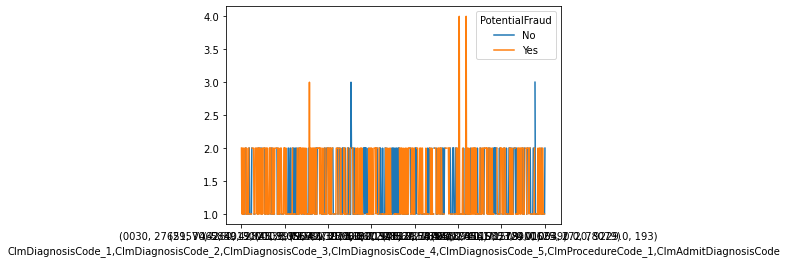

In [162]:
# sns.barplot(x = 'PotentialFraud', y = 'Provider', data = temp)
dup_ip_provider3.unstack(level = 7).plot(y = 'Provider')

In [93]:
dup_ip.groupby(['group','PotentialFraud']).Provider.nunique().to_frame()

Provider
group PotentialFraud          
1     Yes                    2
2     No                     1
      Yes                    1
3     Yes                    2
4     No                     1
      Yes                    1
5     No                     1
      Yes                    1
6     Yes                    2
7     No                     1
      Yes                    1
8     No                     1
      Yes                    1
9     Yes                    2
10    Yes                    2
11    No                     2
12    No                     1
      Yes                    1
13    Yes                    2
14    No                     1
      Yes                    1
15    No                     1
      Yes                    1
16    No                     1
      Yes                    1
17    No                     1
      Yes                    1
18    Yes                    2
19    No                     2
20    No                     1
      Yes                    1
21    No                     1
      Yes                    1
22    No                     1
      Yes                    1
23    No                     1
      Yes                    1
24    No                     1
      Yes                    1
25    No                     2
26    Yes                    2
27    Yes                    2
28    Yes                    2
29    Yes                    2
30    No                     1
      Yes                    1
31    No                     1
      Yes                    1
32    No                     1
      Yes                    1
33    Yes                    2
34    Yes                    2
35    Yes                    2
36    Yes                    2
37    No                     1
      Yes                    1
38    Yes                    2
39    No                     1
      Yes                    1
40    No                     2
41    Yes                    2
42    No                     1
      Yes                    1
43    Yes                    2
44    Yes                    2
45    Yes                    1
46    No                     2
      Yes                    1
47    No                     2
      Yes                    1
48    No                     1
      Yes                    1
49    Yes                    2
50    No                     2
      Yes                    1
51    Yes                    2
52    Yes                    2
53    Yes                    2
54    No                     2
55    No                     1
      Yes                    1
56    No                     1
      Yes                    2
57    Yes                    2
58    No                     1
      Yes                    1
59    Yes                    2
60    No                     1
      Yes                    1
61    Yes                    2
62    No                     1
      Yes                    1
63    No                     1
      Yes                    1
64    No                     1
      Yes                    1
65    Yes                    1
66    Yes                    2
67    No                     2
68    Yes                    2
69    No                     1
      Yes                    1
70    No                     1
      Yes                    1
71    No                     2
72    Yes                    2
73    No                     1
      Yes                    1
74    No                     1
      Yes                    1
75    Yes                    2
76    No                     1
      Yes                    1
77    No                     1
      Yes                    1
78    Yes                    2
79    Yes                    2
80    Yes                    2
81    Yes                    2
82    Yes                    2
83    No                     2
84    No                     1
      Yes                    1
85    Yes                    2
86    No                     1
      Yes                    1
87    Yes                    2
88    No               

In [97]:
dup_ip.groupby(['group']).PotentialFraud.describe()

,count,unique,top,freq
group,,,,
1,2,1,Yes,2
2,2,2,Yes,1
3,2,1,Yes,2
4,2,2,Yes,1
5,2,2,Yes,1
6,2,1,Yes,2
7,2,2,Yes,1
8,2,2,Yes,1
9,2,1,Yes,2


### which provider is info receiver, which provider is info giver

In [316]:
temp = ['ClmDiagnosisCode_1','ClmDiagnosisCode_2','ClmProcedureCode_1',
                             'ClmAdmitDiagnosisCode'] + ['PotentialFraud', 'Provider'] + ['ClaimStartDt']
temp = code_for_duplicate + ['PotentialFraud', 'Provider'] + ['ClaimStartDt']
new = dup_ip.groupby(code_for_duplicate)[temp]
new.head()

,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmProcedureCode_1,ClmAdmitDiagnosisCode,PotentialFraud,Provider,ClaimStartDt,PotentialFraud,Provider,ClaimStartDt
22904,0030,27651,9904.0,27651,Yes,PRV51940,2009-04-19,Yes,PRV51940,2009-04-19
10448,0030,27651,9904.0,27651,Yes,PRV55209,2009-12-14,Yes,PRV55209,2009-12-14
23923,0031,42833,0.0,7907,No,PRV55916,2009-01-08,No,PRV55916,2009-01-08
13514,0031,42833,0.0,7907,Yes,PRV56560,2009-06-16,Yes,PRV56560,2009-06-16
11871,00845,36250,0.0,78791,Yes,PRV53855,2009-09-07,Yes,PRV53855,2009-09-07
26377,00845,V103,0.0,7802,No,PRV51108,2009-11-20,No,PRV51108,2009-11-20
3349,00845,36250,0.0,78791,Yes,PRV52019,2009-12-09,Yes,PRV52019,2009-12-09
2471,00845,486,3893.0,486,Yes,PRV51146,2009-01-06,Yes,PRV51146,2009-01-06
5671,00845,V103,0.0,7802,Yes,PRV53242,2009-06-06,Yes,PRV53242,2009-06-06
37958,00845,486,3893.0,486,No,PRV53308,2009-05-18,No,PRV53308,2009-05-18


### differnece between fraud and nonfraud providers

In [339]:
display('Claims', pd.DataFrame(dup_ip.groupby('PotentialFraud').ClaimID.nunique()))
display('Providers', pd.DataFrame(dup_ip.groupby('PotentialFraud').Provider.nunique()))

'Claims'

,ClaimID
PotentialFraud,
No,602
Yes,831


'Providers'

,Provider
PotentialFraud,
No,412
Yes,283


In [ ]:
display('Claims', pd.DataFrame(dup_ip.groupby('PotentialFraud').ClaimID.nunique()))
display('Providers', pd.DataFrame(dup_ip.groupby('PotentialFraud').Provider.nunique()))

### reuse of patient ID? Not really

In [439]:
dup_ip.groupby('group').BeneID.nunique().value_counts()

2    672
1     15
3     12
4      4
5      1
Name: BeneID, dtype: int64

In [452]:
dup_ip.groupby('group').BeneID.count().value_counts()

2    685
3     14
4      4
5      1
Name: BeneID, dtype: int64

In [428]:
dup_ip_bene = dup_ip[['group', 'PotentialFraud','BeneID']]
dup_ip_bene = dup_ip_bene.sort_values(by = 'group')
dup_ip_bene.head()

,group,PotentialFraud,BeneID
22904,1,Yes,BENE30902
10448,1,Yes,BENE60082
23923,2,No,BENE61653
13514,2,Yes,BENE56846
11871,3,Yes,BENE11923


In [429]:
dup_ip_bene_1 = pd.DataFrame(dup_ip_bene.groupby(['group', 'PotentialFraud']).BeneID.nunique())
dup_ip_bene_1.head()

BeneID
group PotentialFraud        
1     Yes                  2
2     No                   1
      Yes                  1
3     Yes                  2
4     No                   1

In [431]:
# pivot by fraud flag
dup_ip_bene_2 = dup_ip_bene_1.pivot_table(index = 'group', columns = 'PotentialFraud', values = 'BeneID')
print(dup_ip_bene_2.columns)
display(dup_ip_bene_2)

Index(['No', 'Yes'], dtype='object', name='PotentialFraud')


PotentialFraud,No,Yes
group,,
1,NaN,2.0
2,1.0,1.0
3,NaN,2.0
4,1.0,1.0
5,1.0,1.0
6,NaN,2.0
7,1.0,1.0
8,1.0,1.0
9,NaN,2.0


In [432]:
dup_ip_bene_2['hasNo'] = dup_ip_bene_2['No'].isnull()
print('# of groups has no flagged bene', dup_ip_bene_2.hasNo.sum())
print('total # of groups', len(dup_ip_bene_2))
print('percentage', round(dup_ip_bene_2.hasNo.sum() / len(dup_ip_bene_2), ndigits=4)*100, '%')

# of groups has no flagged bene 233
total # of groups 704
percentage 33.1 %


In [433]:
dup_ip_bene = pd.DataFrame(dup_ip.groupby(code_dup_flag).BeneID.agg(['describe']))
dup_ip_bene

describe                        
                                                                                                                                                          count unique         top freq
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmDiagnosisCode_3 ClmDiagnosisCode_4 ClmDiagnosisCode_5 ClmProcedureCode_1 ClmAdmitDiagnosisCode PotentialFraud                                 
0030               27651              V462               4019               V103               9904.0             27651                 Yes                   2      2   BENE60082    1
0031               42833              4730               515                5849               0.0                7907                  No                    1      1   BENE61653    1
                                                                                                                                        Yes                   1      1   BENE56846    1
00845              36250              25000              2768               5533               0.0                78791                 Yes                   2      2   BENE11923    1
                   486                78659              27651              42822              3893.0             486                   No                    1      1  BENE157261    1
                                                                                                                                        Yes                   1      1  BENE122118    1
                   V103               45931              40391              78559              0.0                7802                  No                    1      1  BENE112872    1
                                                                                                                                        Yes                   1      1  BENE148882    1
0088               27651              2761               2768               42842              4513.0             78900                 Yes                   2      2   BENE96067    1
                   37205              27651              99939              2859               4311.0             2768                  No                    1      1   BENE89305    1
                                                                                                                                        Yes                   1      1  BENE141093    1
                   V4365              07999              5368               2720               0.0                0088                  No                    1      1  BENE156059    1
                                                                                                                                        Yes                   1      1   BENE93673    1
03812              5990               1629               34839              5180               9672.0             486                   Yes                   2      2   BENE17367    1
                                      2449               25000              51881              3491.0             0389                  Yes                   2      2   BENE11322    1
03842              2749               5715               99591              2948               0.0                5070                  No                    2      2   BENE71180    1
                   4264               99676              2761               25000              0.0                78079                 No                    1      1  BENE106311    1
                                                                                                                                        Yes                   1      1   BENE29598    1
                   99591              42822              51884              4414               9904.0             27651                 Yes                   2      2   BENE90507    1
03849              5849               2948               496                4589               9904.0  

In [434]:
dup_ip_bene2 = pd.DataFrame(dup_ip.groupby(code_for_duplicate).BeneID.agg(['describe']))
dup_ip_bene2

describe                        
                                                                                                                                           count unique         top freq
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmDiagnosisCode_3 ClmDiagnosisCode_4 ClmDiagnosisCode_5 ClmProcedureCode_1 ClmAdmitDiagnosisCode                                 
0030               27651              V462               4019               V103               9904.0             27651                        2      2   BENE60082    1
0031               42833              4730               515                5849               0.0                7907                         2      2   BENE56846    1
00845              36250              25000              2768               5533               0.0                78791                        2      2   BENE11923    1
                   486                78659              27651              42822              3893.0             486                          2      2  BENE122118    1
                   V103               45931              40391              78559              0.0                7802                         2      2  BENE148882    1
0088               27651              2761               2768               42842              4513.0             78900                        2      2   BENE96067    1
                   37205              27651              99939              2859               4311.0             2768                         2      2   BENE89305    1
                   V4365              07999              5368               2720               0.0                0088                         2      2  BENE156059    1
03812              5990               1629               34839              5180               9672.0             486                          2      2   BENE17367    1
                                      2449               25000              51881              3491.0             0389                         2      2   BENE11322    1
03842              2749               5715               99591              2948               0.0                5070                         2      2   BENE71180    1
                   4264               99676              2761               25000              0.0                78079                        2      2  BENE106311    1
                   99591              42822              51884              4414               9904.0             27651                        2      2   BENE90507    1
03849              5849               2948               496                4589               9904.0             78060                        2      2   BENE63939    1
0389               2761               99591              4019               V441               3893.0             0389                         2      2   BENE14011    1
                   28860              4280               5990               51883              0.0                78097                        2      2   BENE43950    1
                   37230              49121              34831              51881              9390.0             0389                         2      2  BENE116794    1
                   4019               40390              78552              V1254              0.0                6827                         2      2  BENE143043    1
                   41400              4414               25000              5849               0.0                03811                        2      2   BENE90771    1
                   42789              4266               70724              72888              3995.0             486                          2      2   BENE24618    1
                   4871               78720              5750               2760               0.0                78079                        2      2   BENE34383    1
                   57400              V441               3051               1965

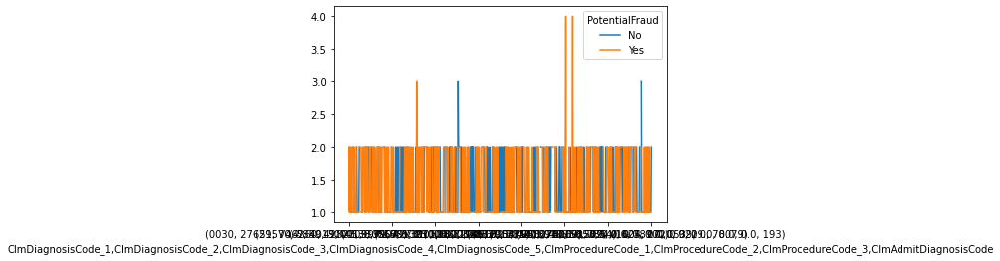

In [374]:
dup_ip_bene.unstack(level = 9).plot(y = ('describe', 'unique'))

### reuse of doctor ID? Not really

In [440]:
dup_ip.groupby('group').AttendingPhysician.nunique().value_counts()

2    671
1     15
3     12
4      4
5      1
0      1
Name: AttendingPhysician, dtype: int64

In [457]:
dup_ip.groupby('group').AttendingPhysician.count().value_counts()

2    684
3     14
4      4
5      1
0      1
Name: AttendingPhysician, dtype: int64

In [456]:
dup_ip.groupby('group').AttendingPhysician.head()

22904    PHY370785
10448    PHY341560
23923    PHY417910
13514    PHY352642
11871    PHY322814
26377    PHY391060
3349     PHY350148
2471     PHY326549
5671     PHY380133
37958    PHY403108
10657    PHY359952
1297     PHY339735
18169    PHY331910
26048    PHY339166
3253     PHY314919
28445    PHY351539
7869     PHY432680
14917    PHY346626
278      PHY379484
5680     PHY404798
27833    PHY354204
8478     PHY332645
26360    PHY412915
33284    PHY374285
20779    PHY316772
22180    PHY383526
20548    PHY404394
27108    PHY397567
17408    PHY430367
17097    PHY414451
5815     PHY378142
36798    PHY345005
34271    PHY343242
26236    PHY312495
8819     PHY384085
38973    PHY421695
32254    PHY329741
25540    PHY404537
32387    PHY320337
33577    PHY424675
32962    PHY347707
3331     PHY318309
223      PHY324509
34795    PHY325202
27354    PHY392238
2922     PHY409386
30878    PHY389788
12611    PHY358177
24563    PHY420342
30461    PHY366859
655      PHY329774
4268     PHY363558
2270     PHY

In [367]:
dup_ip_physician = pd.DataFrame(dup_ip.groupby(code_dup_flag).AttendingPhysician.agg(['describe']))
dup_ip_physician

describe  \
                                                                                                                                                                                                count   
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmDiagnosisCode_3 ClmDiagnosisCode_4 ClmDiagnosisCode_5 ClmProcedureCode_1 ClmProcedureCode_2 ClmProcedureCode_3 ClmAdmitDiagnosisCode PotentialFraud            
0030               27651              V462               4019               V103               9904.0             0.0                0.0                27651                 Yes                   2   
0031               42833              4730               515                5849               0.0                0.0                0.0                7907                  No                    1   
                                                                                                                                                                              Yes                   1   
00845              36250              25000              2768               5533               0.0                0.0                0.0                78791                 Yes                   2   
                   486                78659              27651              42822              3893.0             0.0                0.0                486                   No                    1   
                                                                                                                                                                              Yes                   1   
                   V103               45931              40391              78559              0.0                0.0                0.0                7802                  No                    1   
                                                                                                                                                                              Yes                   1   
0088               27651              2761               2768               42842              4513.0             0.0                0.0                78900                 Yes                   2   
                   37205              27651              99939              2859               4311.0             0.0                0.0                2768                  No                    1   
                                                                                                                                                                              Yes                   1   
                   V4365              07999              5368               2720               0.0                0.0                0.0                0088                  No                    1   
                                                                                                                                                                              Yes                   1   
03812              5990               1629               34839              5180               9672.0             0.0                0.0                486                   Yes                   2   
                                      2449               25000              51881              3491.0             0.0                0.0                0389                  Yes                   2   
03842              2749               5715               99591              2948               0.0                0.0                0.0                5070                  No                    2   
                   4264               99676              2761               25000              0.0                0.0                0.0                78079                 No                    1   
                                                                                                                                                                         

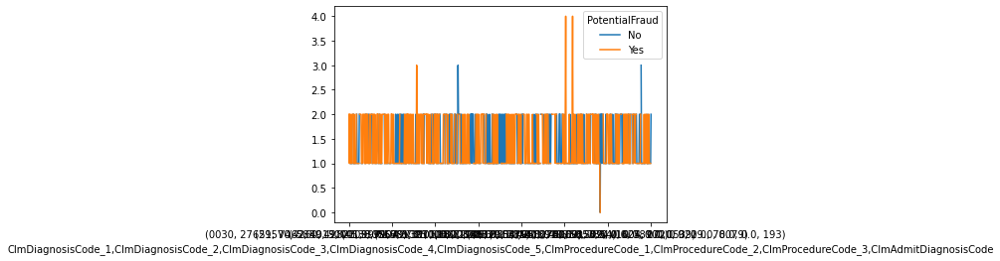

In [372]:
dup_ip_physician.unstack(level = 9).plot(y = ('describe', 'unique'))

### geographic location

In [375]:
dup_ip.columns

Index(['Unnamed: 0', 'BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt',
       'Provider', 'InscClaimAmtReimbursed', 'AttendingPhysician',
       'OperatingPhysician', 'OtherPhysician', 'AdmissionDt',
       'ClmAdmitDiagnosisCode', 'DeductibleAmtPaid', 'DischargeDt',
       'DiagnosisGroupCode', 'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
       'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5',
       'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8',
       'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1',
       'ClmProcedureCode_2', 'ClmProcedureCode_3', 'ClmProcedureCode_4',
       'ClmProcedureCode_5', 'ClmProcedureCode_6', 'DOB', 'DOD', 'Gender',
       'Race', 'RenalDiseaseIndicator', 'State', 'County',
       'NoOfMonths_PartACov', 'NoOfMonths_PartBCov', 'ChronicCond_Alzheimer',
       'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
       'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary',
       'ChronicCond_Depression

In [389]:
dup_ip_geo = pd.DataFrame(dup_ip.groupby(code_dup_flag).State.agg(['describe']))
dup_ip_geo

describe  \
                                                                                                                                                                                                count   
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmDiagnosisCode_3 ClmDiagnosisCode_4 ClmDiagnosisCode_5 ClmProcedureCode_1 ClmProcedureCode_2 ClmProcedureCode_3 ClmAdmitDiagnosisCode PotentialFraud            
0030               27651              V462               4019               V103               9904.0             0.0                0.0                27651                 Yes                 2.0   
0031               42833              4730               515                5849               0.0                0.0                0.0                7907                  No                  1.0   
                                                                                                                                                                              Yes                 1.0   
00845              36250              25000              2768               5533               0.0                0.0                0.0                78791                 Yes                 2.0   
                   486                78659              27651              42822              3893.0             0.0                0.0                486                   No                  1.0   
                                                                                                                                                                              Yes                 1.0   
                   V103               45931              40391              78559              0.0                0.0                0.0                7802                  No                  1.0   
                                                                                                                                                                              Yes                 1.0   
0088               27651              2761               2768               42842              4513.0             0.0                0.0                78900                 Yes                 2.0   
                   37205              27651              99939              2859               4311.0             0.0                0.0                2768                  No                  1.0   
                                                                                                                                                                              Yes                 1.0   
                   V4365              07999              5368               2720               0.0                0.0                0.0                0088                  No                  1.0   
                                                                                                                                                                              Yes                 1.0   
03812              5990               1629               34839              5180               9672.0             0.0                0.0                486                   Yes                 2.0   
                                      2449               25000              51881              3491.0             0.0                0.0                0389                  Yes                 2.0   
03842              2749               5715               99591              2948               0.0                0.0                0.0                5070                  No                  2.0   
                   4264               99676              2761               25000              0.0                0.0                0.0                78079                 No                  1.0   
                                                                                                                                                                         

In [47]:
pd.DataFrame(dup_ip.groupby(code_dup_flag).State.apply(statistics.mode))

State
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmDiagnosisCode_3 ClmDiagnosisCode_4 ClmDiagnosisCode_5 ClmProcedureCode_1 ClmProcedureCode_2 ClmProcedureCode_3 ClmAdmitDiagnosisCode PotentialFraud       
0030               27651              V462               4019               V103               9904.0             0.0                0.0                27651                 Yes                 7
0031               42833              4730               515                5849               0.0                0.0                0.0                7907                  No                 39
                                                                                                                                                                              Yes                45
00845              36250              25000              2768               5533               0.0                0.0                0.0                78791                 Yes                22
                   486                78659              27651              42822              3893.0             0.0                0.0                486                   No                 18
                                                                                                                                                                              Yes                 3
                   V103               45931              40391              78559              0.0                0.0                0.0                7802                  No                  1
                                                                                                                                                                              Yes                18
0088               27651              2761               2768               42842              4513.0             0.0                0.0                78900                 Yes                45
                   37205              27651              99939              2859               4311.0             0.0                0.0                2768                  No                  5
                                                                                                                                                                              Yes                49
                   V4365              07999              5368               2720               0.0                0.0                0.0                0088                  No                 10
                                                                                                                                                                              Yes                23
03812              5990               1629               34839              5180               9672.0             0.0                0.0                486                   Yes                16
                                      2449               25000              51881              3491.0             0.0                0.0                0389                  Yes                30
03842              2749               5715               99591              2948               0.0                0.0                0.0                5070                  No                 49
                   4264               99676              2761               25000              0.0                0.0                0.0                78079                 No                 46
                                                                                                                                                                              Yes                14
                   99591              42822              51884              4414               9904.0             0.0                0.0                27651                 Yes                45
03849              5849               2948               496              

In [461]:
dup_ip.groupby(['group', 'PotentialFraud']).State.apply(statistics.mode).to_frame()

State
group PotentialFraud       
1     Yes                 7
2     No                 39
      Yes                45
3     Yes                22
4     No                 18
      Yes                 3
5     No                  1
      Yes                18
6     Yes                24
7     No                  5
      Yes                49
8     No                 10
      Yes                23
9     Yes                16
10    Yes                30
11    No                 49
12    No                 46
      Yes                14
13    Yes                39
14    No                 14
      Yes                26
15    No                 33
      Yes                 4
16    No                 45
      Yes                 5
17    No                 39
      Yes                 3
18    Yes                 1
19    No                 11
20    No                 33
      Yes                 5
21    No                 36
      Yes                 4
22    No                 51
      Yes                36
23    No                 10
      Yes                39
24    No                 47
      Yes                33
25    No                 33
26    Yes                31
27    Yes                39
28    Yes                11
29    Yes                 7
30    No                 10
      Yes                25
31    No                 37
      Yes                15
32    No                 37
      Yes                 7
33    Yes                10
34    Yes                50
35    Yes                52
36    Yes                31
37    No                 24
      Yes                 5
38    Yes                36
39    No                 10
      Yes                38
40    No                 21
41    Yes                31
42    No                 42
      Yes                 5
43    Yes                10
44    Yes                45
45    Yes                10
46    No                 28
      Yes                50
47    No                 36
      Yes                31
48    No                 45
      Yes                31
49    Yes                43
50    No                 33
      Yes                36
51    Yes                 4
52    Yes                36
53    Yes                51
54    No                 10
55    No                 51
      Yes                 5
56    No                  4
      Yes                11
57    Yes                11
58    No                 19
      Yes                26
59    Yes                 5
60    No                 33
      Yes                14
61    Yes                29
62    No                 54
      Yes                19
63    No                 45
      Yes                23
64    No                 42
      Yes                30
65    Yes                42
66    Yes                 5
67    No                  3
68    Yes                 6
69    No                  5
      Yes                50
70    No                 14
      Yes                 4
71    No                  8
72    Yes                45
73    No                  5
      Yes                11
74    No                  5
      Yes                 1
75    Yes                31
76    No                 23
      Yes                45
77    No                 39
      Yes                14
78    Yes                33
79    Yes                51
80    Yes                27
81    Yes                21
82    Yes                22
83    No                 32
84    No                 45
      Yes                15
85    Yes                 5
86    No                 26
      Yes                16
87    Yes                18
88    No                 11
      Yes                49
89    No                  3
      Yes                10
90    No                  5
      Yes                18
91    Yes                34
92    Yes                39
93    Yes                39
94    No                 26
      Yes                36
95    No                 38
      Yes                50
96    No                  3
      Yes         

In [48]:
pd.DataFrame(dup_ip.groupby(code_dup_flag).State.nunique())

State
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmDiagnosisCode_3 ClmDiagnosisCode_4 ClmDiagnosisCode_5 ClmProcedureCode_1 ClmProcedureCode_2 ClmProcedureCode_3 ClmAdmitDiagnosisCode PotentialFraud       
0030               27651              V462               4019               V103               9904.0             0.0                0.0                27651                 Yes                 2
0031               42833              4730               515                5849               0.0                0.0                0.0                7907                  No                  1
                                                                                                                                                                              Yes                 1
00845              36250              25000              2768               5533               0.0                0.0                0.0                78791                 Yes                 2
                   486                78659              27651              42822              3893.0             0.0                0.0                486                   No                  1
                                                                                                                                                                              Yes                 1
                   V103               45931              40391              78559              0.0                0.0                0.0                7802                  No                  1
                                                                                                                                                                              Yes                 1
0088               27651              2761               2768               42842              4513.0             0.0                0.0                78900                 Yes                 2
                   37205              27651              99939              2859               4311.0             0.0                0.0                2768                  No                  1
                                                                                                                                                                              Yes                 1
                   V4365              07999              5368               2720               0.0                0.0                0.0                0088                  No                  1
                                                                                                                                                                              Yes                 1
03812              5990               1629               34839              5180               9672.0             0.0                0.0                486                   Yes                 2
                                      2449               25000              51881              3491.0             0.0                0.0                0389                  Yes                 2
03842              2749               5715               99591              2948               0.0                0.0                0.0                5070                  No                  2
                   4264               99676              2761               25000              0.0                0.0                0.0                78079                 No                  1
                                                                                                                                                                              Yes                 1
                   99591              42822              51884              4414               9904.0             0.0                0.0                27651                 Yes                 2
03849              5849               2948               496              

In [82]:
dup_ip_state_mode = pd.DataFrame(dup_ip.groupby(['group', 'PotentialFraud'])['State'].apply(statistics.mode))
dup_ip_state_mode

State
group PotentialFraud       
1     Yes                 7
2     No                 39
      Yes                45
3     Yes                22
4     No                 18
      Yes                 3
5     No                  1
      Yes                18
6     Yes                45
7     No                  5
      Yes                49
8     No                 10
      Yes                23
9     Yes                16
10    Yes                30
11    No                 49
12    No                 46
      Yes                14
13    Yes                45
14    No                 14
      Yes                26
15    No                 33
      Yes                 4
16    No                 45
      Yes                 5
17    No                 39
      Yes                 3
18    Yes                24
19    No                 37
20    No                 33
      Yes                 5
21    No                 36
      Yes                 4
22    No                 51
      Yes                36
23    No                 10
      Yes                39
24    No                 47
      Yes                33
25    No                 15
26    Yes                26
27    Yes                49
28    Yes                36
29    Yes                10
30    No                 10
      Yes                25
31    No                 37
      Yes                15
32    No                 37
      Yes                 7
33    Yes                14
34    Yes                50
35    Yes                52
36    Yes                36
37    No                 24
      Yes                 5
38    Yes                34
39    No                 10
      Yes                38
40    No                 22
41    Yes                31
42    No                 42
      Yes                 5
43    Yes                10
44    Yes                33
45    Yes                10
46    No                 52
      Yes                50
47    No                 39
      Yes                31
48    No                 45
      Yes                31
49    Yes                43
50    No                 33
      Yes                36
51    Yes                 4
52    Yes                36
53    Yes                51
54    No                 52
55    No                 51
      Yes                 5
56    No                  4
      Yes                11
57    Yes                11
58    No                 19
      Yes                26
59    Yes                21
60    No                 33
      Yes                14
61    Yes                29
62    No                 54
      Yes                19
63    No                 45
      Yes                23
64    No                 42
      Yes                30
65    Yes                42
66    Yes                22
67    No                  3
68    Yes                 6
69    No                  5
      Yes                50
70    No                 14
      Yes                 4
71    No                  8
72    Yes                45
73    No                  5
      Yes                11
74    No                  5
      Yes                 1
75    Yes                22
76    No                 23
      Yes                45
77    No                 39
      Yes                14
78    Yes                33
79    Yes                51
80    Yes                27
81    Yes                25
82    Yes                22
83    No                 32
84    No                 45
      Yes                15
85    Yes                 5
86    No                 26
      Yes                16
87    Yes                33
88    No                 11
      Yes                49
89    No                  3
      Yes                10
90    No                  5
      Yes                18
91    Yes                34
92    Yes                39
93    Yes                11
94    No                 26
      Yes                36
95    No                 38
      Yes                50
96    No                  3
      Yes         

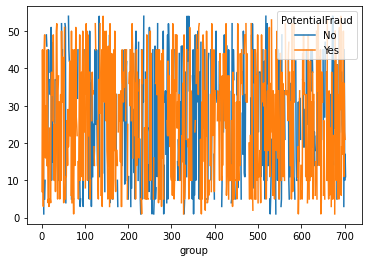

In [80]:
# sns.barplot(x = 'PotentialFraud', y = 'State', data = dup_ip_state_mode)
dup_ip_state_mode.unstack(level = 1).plot(y = 'State')

### duplicate claim sources

In [89]:
# duplicate claim dataframe
inpt_dup = inpt_flag[inpt_flag.duplicated(subset = code_for_duplicate, keep=False)]
outpt_dup = outpt_flag[outpt_flag.duplicated(subset = code_for_duplicate, keep=False)]
inpt_dup.to_csv( '../output/inpatient_duplicate.csv')
outpt_dup.to_csv('../output/outpatient_duplicate.csv')
# keep = False will mark all duplicates

In [90]:
display(inpt_dup.columns)
display(outpt_dup.columns)

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode',
       'DeductibleAmtPaid', 'DischargeDt', 'DiagnosisGroupCode',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
       'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
       'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
       'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
       'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
       'ClmProcedureCode_6', 'PotentialFraud'],
      dtype='object')

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
       'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5',
       'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8',
       'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1',
       'ClmProcedureCode_2', 'ClmProcedureCode_3', 'ClmProcedureCode_4',
       'ClmProcedureCode_5', 'ClmProcedureCode_6', 'DeductibleAmtPaid',
       'ClmAdmitDiagnosisCode', 'PotentialFraud'],
      dtype='object')

,,,,Provider
ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmProcedureCode_1,ClmAdmitDiagnosisCode,
0,0,0.0,0,2284
4019,0,0.0,0,1258
4011,0,0.0,0,1148


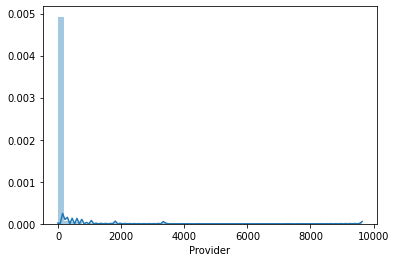

In [101]:
# providers
# display(inpt_dup[code_for_duplicate].nunique())
# display(pd.DataFrame(inpt_dup.groupby(code_for_duplicate).Provider.count()))

# display(inpt_dup[inpt_dup['ClmDiagnosisCode_1'] == '0389'])
# display(inpt_dup[inpt_dup['ClmDiagnosisCode_1'] == '0030'])
# display(inpt_dup[inpt_dup['ClmDiagnosisCode_1'] == '185'].sort_values(by = 'ClmDiagnosisCode_1'))
# display(inpt_dup[inpt_dup['ClmDiagnosisCode_1'] == '7224'].sort_values(by = 'ClmDiagnosisCode_1'))

code_for_duplicate_short = ['ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
                            'ClmProcedureCode_1','ClmAdmitDiagnosisCode']
# ## inpatient
# dup_provider_inpt = pd.DataFrame(inpt_dup.groupby(code_for_duplicate_short).\
#                             Provider.nunique().sort_values(ascending = False))
# display(dup_provider_inpt.head(3))
# # plot
# provider_count_inpt = pd.DataFrame(dup_provider_inpt.Provider.value_counts()).sort_index().\
#                         reset_index().rename(columns={'index':'number'}).sort_values(by = 'number')
# k = sns.barplot(x = 'number', y = 'Provider', data = provider_count_inpt)

# for index, row in provider_count_inpt.iterrows():
#     k.text(row.name,row.Provider, row.Provider, color='black', ha="center")
# plt.title('Inpatient Duplicated Claims Provider Numbers')
# plt.show()
# plt.savefig('../output/inpatient_duplicate_claim_provider_num.png')

## outpatient
# groupby automatically exclude NA
dup_provider_outpt = pd.DataFrame(outpt_dup.groupby(code_for_duplicate_short).\
                            Provider.nunique().sort_values(ascending = False))
display(dup_provider_outpt.head(3))
# plot
provider_count_outpt = pd.DataFrame(dup_provider_outpt.Provider.value_counts()).sort_index().\
                        reset_index().rename(columns={'index':'number'}).sort_values(by = 'number')
# g = sns.bar(x = 'number', y = 'Provider', data = provider_count_outpt)
g = sns.distplot(provider_count_outpt['Provider'])
# for index, row in provider_count_outpt.iterrows():
#     g.text(row.name,row.Provider, row.Provider, color='black', ha="center")
# plt.title('Outpatient Duplicated Claims Provider Numbers')
# plt.show()
# # introduce fraudulant flag
# plt.savefig('../output/outpatient_duplicate_claim_provider_num.png')

(array([209.,   2.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([1.0000e+00, 9.6380e+02, 1.9266e+03, 2.8894e+03, 3.8522e+03,
        4.8150e+03, 5.7778e+03, 6.7406e+03, 7.7034e+03, 8.6662e+03,
        9.6290e+03]),
 <a list of 10 Patch objects>)

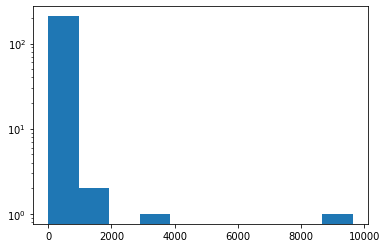

In [109]:
plt.hist(x = provider_count_outpt['Provider'], log = True)

In [108]:
provider_count_outpt.sort_values(by = 'Provider', ascending = False).iloc[]

,number,Provider
1,2,9629
2,3,3362
3,4,1789
4,5,1075
5,6,765


### information provider & receivers

In [46]:
print(inpt.Provider.nunique())
print(flag.Provider.nunique())

2092
5410


### Merge with Fraud Flag

In [ ]:
sns.boxplot(y = )

In [50]:
inpt_flag = inpt.merge(flag, on = 'Provider')
outpt_flag = outpt.merge(flag, on = 'Provider')

In [86]:
inpt_flag.columns

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode',
       'DeductibleAmtPaid', 'DischargeDt', 'DiagnosisGroupCode',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
       'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
       'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
       'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
       'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
       'ClmProcedureCode_6', 'PotentialFraud'],
      dtype='object')

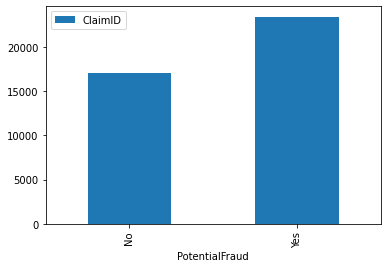

In [63]:
inpt_flag.groupby('PotentialFraud').count().plot(y = 'ClaimID', use_index = True, kind = 'bar')

In [100]:
df_ip.groupby('PotentialFraud').ClaimID.count()

PotentialFraud
No     17072
Yes    23402
Name: ClaimID, dtype: int64

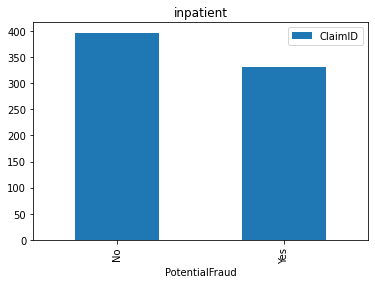

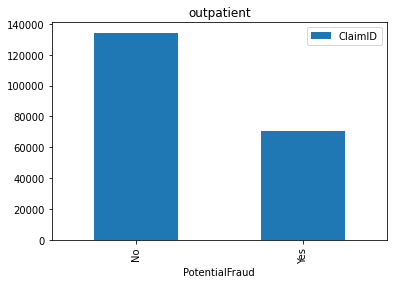

In [82]:
# duplicated claims
code_for_duplicate = ['ClmDiagnosisCode_1','ClmDiagnosisCode_2', 'ClmDiagnosisCode_3','ClmDiagnosisCode_4',
                      'ClmDiagnosisCode_5','ClmProcedureCode_1', 'ClmProcedureCode_2', 'ClmProcedureCode_4',
                      'ClmAdmitDiagnosisCode']

# # keep = first will mark all duplicates except the 1st occurrence
# inpt_duplicate_flag = inpt_flag.duplicated(subset = code_for_duplicate, keep='first').sum()
# print('inpatient', inpt.shape[0], 'duplicate #', inpt_duplicate)

# outpt_duplicate_flag = outpt_flag.duplicated(subset = code_for_duplicate, keep='first').sum()
# print('outpatient', outpt.shape[0], 'duplicate #', outpt_duplicate)

inpt_flag[inpt_flag.duplicated(subset = code_for_duplicate, keep='first')].groupby('PotentialFraud').count().\
    plot(y = 'ClaimID', use_index = True, kind = 'bar', title = 'inpatient')
plt.savefig('../output/duplicateclaims_flag_inpatient.png')

outpt_flag[outpt_flag.duplicated(subset = code_for_duplicate, keep='first')].groupby('PotentialFraud').count().\
    plot(y = 'ClaimID', use_index = True, kind = 'bar', title = 'outpatient')
plt.savefig('../output/duplicateclaims_flag_outpatient.png')

inpatient duplicate 5919
outpatient duplicate 323119


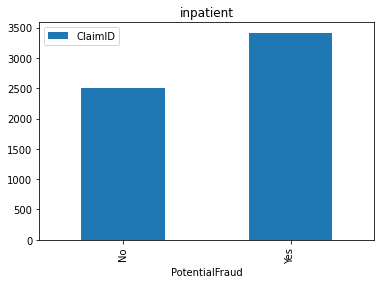

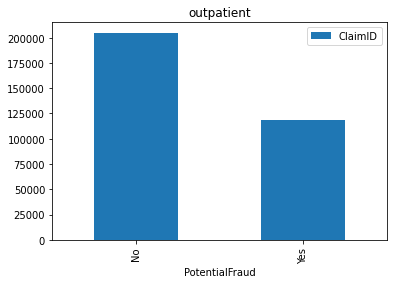

In [114]:
code_for_duplicate_short = ['ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
                            'ClmProcedureCode_1','ClmAdmitDiagnosisCode']

inpt_dup_flag_short = inpt_flag.duplicated(subset = code_for_duplicate_short, keep= False)
print('inpatient duplicate', inpt_dup_flag_short.sum())
inpt_flag[inpt_dup_flag_short].groupby('PotentialFraud').count().\
    plot(y = 'ClaimID', use_index = True, kind = 'bar', title = 'inpatient')

outpt_dup_flag_short = outpt_flag.duplicated(subset = code_for_duplicate_short, keep=False)
print('outpatient duplicate', outpt_dup_flag_short.sum())
outpt_flag[outpt_dup_flag_short].groupby('PotentialFraud').count().\
    plot(y = 'ClaimID', use_index = True, kind = 'bar', title = 'outpatient')

In [158]:
inpt.OtherPhysician.nunique()

2877

In [ ]:
# of physicians (per claim) groupby provider, 0, 1, 2, 3, 

### physicians

In [132]:
code_for_duplicate_short

['ClmDiagnosisCode_1',
 'ClmDiagnosisCode_2',
 'ClmProcedureCode_1',
 'ClmAdmitDiagnosisCode']

In [148]:
inpt_flag_dup_doctor = inpt_flag[inpt_dup_flag_short].groupby(['ClmDiagnosisCode_1','ClmDiagnosisCode_2',
        'ClmProcedureCode_1','ClmAdmitDiagnosisCode','PotentialFraud']).AttendingPhysician.nunique()
inpt_flag_dup_doctor

ClmDiagnosisCode_1  ClmDiagnosisCode_2  ClmProcedureCode_1  ClmAdmitDiagnosisCode  PotentialFraud
0030                27651               9904.0              27651                  Yes                2
0031                42833               0.0                 7907                   No                 1
                                                                                   Yes                1
00845               2449                0.0                 78900                  No                 1
                                                                                   Yes                1
                    27651               0.0                 78791                  Yes                4
                    36250               0.0                 78791                  Yes                2
                    4019                0.0                 78791                  No                 1
                                                                      

In [151]:
pd.DataFrame(inpt_flag_dup_doctor).sort_values(by = "AttendingPhysician", ascending = False)

AttendingPhysician
ClmDiagnosisCode_1 ClmDiagnosisCode_2 ClmProcedureCode_1 ClmAdmitDiagnosisCode PotentialFraud                    
V5789              4019               0.0                V5789                 Yes                             16
                   5990               0.0                V5789                 Yes                             16
486                4019               0.0                486                   Yes                             14
49121              4019               0.0                49121                 Yes                             13
486                4019               0.0                486                   No                              13
V5789              4019               0.0                V5789                 No                              13
78659              4019               0.0                78650                 No                              12
71536              4019               8154.0             71536                 Yes                             12
7802               4019               0.0                7802                  Yes                             11
486                25000              0.0                486                   Yes                             11
43310              4019               3812.0             43310                 Yes                             11
                                                                               No                              10
71536              4019               8154.0             71536                 No                              10
486                496                0.0                486                   No                              10
                   4280               0.0                486                   Yes                             10
5990               4019               0.0                5990                  No                              10
486                4280               0.0                486                   No                              10
                   27651              0.0                486                   Yes                             10
5990               25000              0.0                5990                  No                               9
42731              4019               0.0                42731                 Yes                              9
5770               4019               0.0                5770                  No                               9
486                2724               0.0                486                   Yes                              9
4280               25000              0.0                4280                  Yes                              8
486                41401              0.0                486                   No                               8
78659              4019               0.0                78650                 Yes                              8
486                25000              0.0                486                   No                               8
4280               4019               0.0                4280                  Yes                              8
V5789              25000              0.0                V5789                 Yes                              8
486                496                0.0                486                   Yes                              8
49121              4280               0.0                49121                 Yes                              8
486                42731              0.0                486                   Yes                              8
78659              2724               0.0                78650                 No                               7
                   496                0.0                78650                 Yes                              7
49121              41401              0.0                49121                 Yes                       

(array([1837., 1370.,   77.,   67.,   15.,   13.,   10.,    2.,    4.,
           2.]),
 array([ 0. ,  1.6,  3.2,  4.8,  6.4,  8. ,  9.6, 11.2, 12.8, 14.4, 16. ]),
 <a list of 10 Patch objects>)

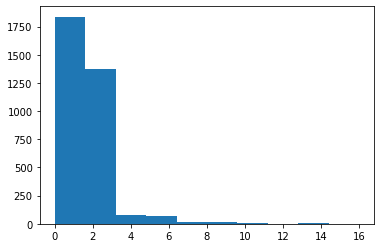

In [141]:
plt.hist(pd.DataFrame(inpt_flag_dup_doctor)['AttendingPhysician'])

In [ ]:
## Patrice 
in_merge[['ClaimStartDt','ClaimEndDt']].applymap(pd.to_datetime)
ClmDiagnCodes = ['ClmProcedureCode_{}'.format(x) for x in range(1,7)]
### Create new col
in_merge['NumProcCode'] =in_merge[ClmProcedureCodes].notnull().to_numpy().sum(axis = 1)
# date
in_merge['StayDuration'] = (in_merge['DischargeDt'] - in_merge['AdmissionDt']).dt.days